In [1]:
import torch
from diffusers import StableDiffusionPipeline
from diffusers import StableDiffusionInpaintPipeline
from diffusers import utils
from diffusers import UNet2DConditionModel
from diffusers import AudioLDMPipeline
from diffusers import DDIMScheduler,PNDMScheduler

from torchvision.utils import save_image
import csv
import IPython.display as ipd

import matplotlib.pyplot as plt
from torchvision.utils import save_image
from tqdm import tqdm
import numpy as np
import argparse, os, sys, datetime, glob, importlib, csv
import math

sys.path.append(os.getcwd())
# import cv2
import torchaudio
import torchaudio.transforms as transforms
import time
from encodec import EncodecModel
from encodec.utils import convert_audio
import torch.nn.functional as F
from transformers import AutoTokenizer, T5EncoderModel,T5TokenizerFast
from torchsummary import summary
from IPython.display import FileLink



In [2]:
model_path = "/u/li19/data_folder/model_cache/audio_journey_128"
device = 'cuda'
# model_path = "CompVis/stable-diffusion-v1-4"

In [3]:
channel_means = [  2.2741,  11.2872,  -3.3938,  -1.5556,  -0.0302,   7.6089,  -5.5797,
          0.2140,  -0.3536,   6.0188,   1.8582,  -0.1103,   2.2026,  -7.0081,
         -0.0721,  -8.7742,  -2.4182,   4.4447,  -0.2184,  -0.5209, -11.9494,
         -4.0776,  -1.4555,  -1.6505,   6.4522,   0.0997,  10.4067,  -3.9268,
         -7.0161,  -3.1253,  -8.5145,   3.1156,   2.2279,  -5.2728,   2.8541,
         -3.3980,  -1.1775,  -9.7662,   0.3048,   3.8765,   4.5021,   2.6239,
         14.1057,   3.2852,   1.9702,  -1.6345,  -4.3733,   3.8198,   1.1421,
         -4.4388,  -5.3498,  -6.6044,  -0.4426,   2.8000,  -7.0858,   2.4989,
         -1.4915,  -6.1275,  -3.0896,   1.1227,  -8.7984,  -4.9831,  -0.3888,
         -3.1017,  -7.5745,  -2.4760,   1.0540,  -2.5350,   0.0999,   0.6126,
         -1.2301,  -5.8328,  -0.7275,  -1.2316,  -2.2532, -11.5017,   0.9166,
         -2.2268,  -2.8496,  -0.5093,  -0.3037,  -6.3689,  -9.5225,   4.5965,
          3.1329,  -1.8315,   5.3135,  -3.8361,   1.6335,  -0.1705,  11.0513,
          5.3907,  -0.2660,   4.6109,  -8.9019,   6.5515,   0.8596,  16.6196,
         -0.7732,   4.1237,   2.9267,   9.9652,   4.6615,   1.4660,  -9.7225,
         -1.5841,  -0.5714,  -4.3343,  -0.1914,   2.8624, -11.2139,  -2.5840,
         -6.7120,   0.2601,  -5.4195,   0.3554,   3.0438,  -1.0295,   1.3360,
         -4.1767,   0.6468,   1.8145,   1.7140,   3.0185,   0.4881,   0.5796,
         -2.4755,   2.6202]
channel_stds = [1.7524, 1.2040, 1.1098, 1.1021, 1.3688, 1.1374, 1.8660, 0.9791, 1.4331,
        1.7740, 1.2690, 1.0297, 0.9953, 1.5363, 1.2166, 1.6564, 1.4858, 1.2349,
        1.5086, 1.0814, 1.4421, 0.9258, 0.9343, 1.2007, 1.3848, 1.2732, 1.7759,
        1.3544, 1.4707, 1.2685, 1.7004, 1.2947, 1.2967, 1.8925, 0.9231, 0.7637,
        1.3777, 1.6680, 0.9658, 0.9257, 0.5259, 0.9949, 1.7375, 1.0734, 1.2916,
        0.8570, 0.6263, 0.9911, 0.9574, 0.9979, 1.5969, 1.1886, 1.1147, 1.2280,
        2.0169, 1.1813, 1.2589, 1.1162, 1.3689, 1.2516, 1.2139, 1.0343, 1.1895,
        1.1726, 1.1923, 1.2714, 1.0043, 0.6465, 1.3860, 1.4449, 0.9567, 1.0218,
        0.9560, 1.4757, 1.0544, 0.8112, 1.4364, 1.0843, 1.2569, 1.0138, 1.1886,
        0.8627, 1.1016, 1.4231, 1.3607, 1.1215, 1.9759, 1.5381, 0.9219, 0.8572,
        0.6288, 0.8029, 1.1699, 1.1962, 1.5783, 0.9037, 1.2214, 2.0878, 1.3015,
        1.2254, 1.2898, 1.5421, 1.2834, 1.7237, 1.3471, 0.8689, 1.2807, 1.2174,
        1.2048, 0.6644, 1.5379, 1.4997, 0.7932, 0.7638, 0.8680, 1.3108, 1.8261,
        1.3964, 1.2147, 1.1391, 1.0011, 1.5988, 1.5721, 1.0963, 1.4303, 1.3737,
        1.5043, 1.3079]


def show_split_img(image, title=None):
    # Split the image in half horizontally
    height, width = image.shape
    half_width = width // 2
    left_half = image[:, :half_width]
    right_half = image[:, half_width:]

    # Create the subplots and plot the left and right halves of the image
    fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(16, 2))
    axs[0].imshow(left_half)
    axs[1].imshow(right_half)

    # Hide the x and y axis ticks and labels for a cleaner plot
    for ax in axs:
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xticklabels([])
        ax.set_yticklabels([])

    # Show the plot
    # if (title):
    #     axs[0].title(title)
    plt.show()

    
def rescale(image):
    image = torch.Tensor.view(image, [128, 24, 21]).clone().to(device)
    mean_v = torch.tensor(channel_means).to(device)
    std_v =torch.tensor(channel_stds).to(device)
    image = image * std_v.view(-1,1,1) + mean_v.view(-1,1,1)
    
    # for row, mean, std in zip(image, channel_means, channel_stds):
    #     row *= std 
    #     row += mean
    
    image = torch.Tensor.view(image, [1, 128, 504])
    return image

def visualize_channels(img):
    test_img = img.clone()
    test_img = torch.Tensor.view(test_img, [128, 24, 21])
    fig, axs = plt.subplots(8, 16, figsize=(12, 12))
    for ax, layer in zip(axs.flatten(), test_img):
        ax.imshow(layer.cpu().numpy())
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xticklabels([])
        ax.set_yticklabels([])


In [4]:
pipe = StableDiffusionPipeline.from_pretrained(
    model_path,
    device_map=None, 
    safety_checker=None,
    low_cpu_mem_usage=False)

pipe.to(device)
pipe.vae_scale_factor = 1



/u/li19/data_folder/anaconda3/envs/diffuse/lib/python3.10/site-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


In [5]:
tokenizer = AutoTokenizer.from_pretrained("t5-large", model_max_length=52)
text_encoder = T5EncoderModel.from_pretrained("t5-large")


Some weights of the model checkpoint at t5-large were not used when initializing T5EncoderModel: ['decoder.block.3.layer.1.EncDecAttention.k.weight', 'decoder.block.15.layer.1.EncDecAttention.q.weight', 'decoder.block.4.layer.0.SelfAttention.q.weight', 'decoder.block.7.layer.2.DenseReluDense.wi.weight', 'decoder.block.3.layer.1.EncDecAttention.o.weight', 'decoder.block.21.layer.2.DenseReluDense.wo.weight', 'decoder.block.11.layer.2.layer_norm.weight', 'decoder.block.13.layer.0.SelfAttention.k.weight', 'decoder.block.17.layer.2.DenseReluDense.wo.weight', 'decoder.block.18.layer.0.SelfAttention.q.weight', 'decoder.block.3.layer.0.SelfAttention.q.weight', 'decoder.block.20.layer.2.layer_norm.weight', 'decoder.block.13.layer.2.DenseReluDense.wo.weight', 'decoder.block.6.layer.1.layer_norm.weight', 'decoder.block.9.layer.2.layer_norm.weight', 'decoder.block.18.layer.1.EncDecAttention.k.weight', 'decoder.block.3.layer.2.DenseReluDense.wi.weight', 'decoder.block.10.layer.0.SelfAttention.k.wei

In [6]:
text_encoder.config.use_attention_mask = False


In [7]:
print(hasattr(text_encoder.config, "use_attention_mask") and text_encoder.config.use_attention_mask)

False


In [8]:

pipe.tokenizer = tokenizer
pipe.text_encoder = text_encoder.to(device)

In [9]:
model = EncodecModel.encodec_model_24khz()
model.set_target_bandwidth(6.0)
model = model.to(device)
# pipe.vae = model

In [10]:

conf = "/u/li19/data_folder/testing/audio_journey_128_t5_short_scratch/checkpoint-38000/unet/"

new_unet = UNet2DConditionModel.from_pretrained(conf)
new_unet.to(device)
pipe.unet = new_unet



In [11]:
print(pipe.scheduler)

PNDMScheduler {
  "_class_name": "PNDMScheduler",
  "_diffusers_version": "0.15.1",
  "beta_end": 0.012,
  "beta_schedule": "squaredcos_cap_v2",
  "beta_start": 0.00085,
  "clip_sample": false,
  "num_train_timesteps": 1000,
  "prediction_type": "epsilon",
  "set_alpha_to_one": false,
  "skip_prk_steps": true,
  "steps_offset": 1,
  "trained_betas": null
}



In [12]:
noise_scheduler = DDIMScheduler.from_pretrained("/u/li19/data_folder/model_cache/audio_journey_128_ddim_2", subfolder="scheduler")
pipe.scheduler = noise_scheduler

In [13]:
noise_scheduler = PNDMScheduler.from_pretrained("/u/li19/data_folder/model_cache/audio_journey_128", subfolder="scheduler")
pipe.scheduler = noise_scheduler

In [28]:
prompts =  [
    "sound of shuffling cards",
    "sound of a bird",
"sound of a fart",
          "a dog howling",
           "Speech, Singing, and Yodeling",
           "sound of a person gargling",
            " sound of A Hammer striking wood",
    #     "The sound of Brass instrument",
    "A train whistle heard in the distance",
        "The sound of Brass instrument together with piano, playing very sad music",
            "The sound of Brass instrument together with piano, playing very happy music",
           ]
          



imgs = [pipe(prompt=p, width=504, height=128, num_inference_steps=50, guidance_scale=5.5, output_type="latent", unet_mask=False, debug=False).images[0] for p in prompts]






# print(imgs[0].mean())
# print(imgs[0].std())



  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

In [29]:
norm_imgs = [rescale(img[0]) for img in imgs]
# norm_imgs = [img[0] for img in imgs]
# d_imgs = [imgs[i].detach().cpu() - norm_imgs[i] for i in range(len(prompts))]

sound of shuffling cards


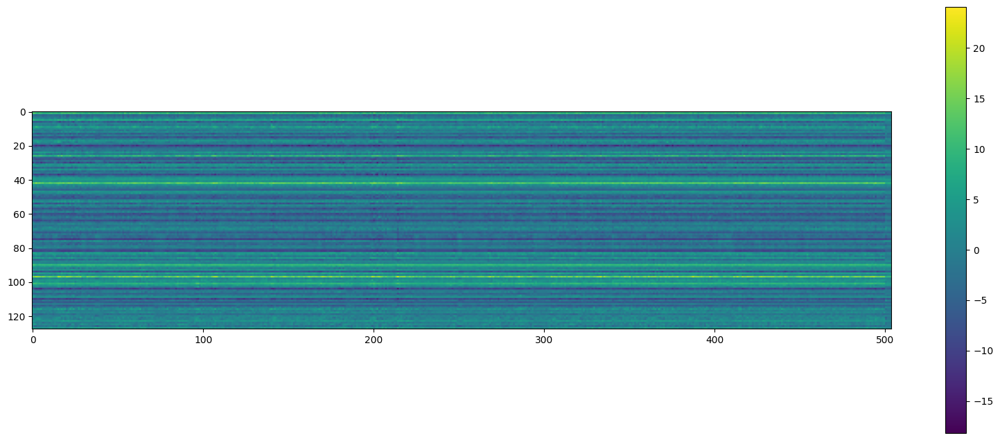

/u/li19/diffusers_with_dataloader/notebooks/imgs/simple_plotsound of shuffling cards.png

sound of a bird


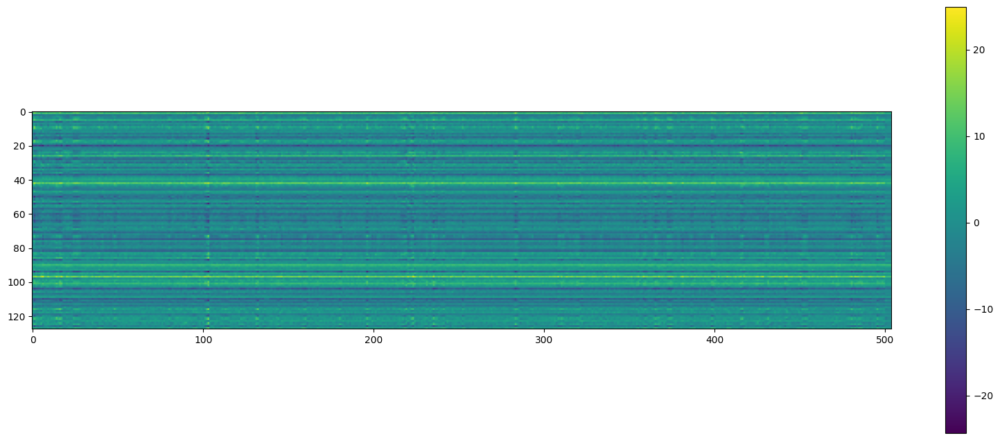

/u/li19/diffusers_with_dataloader/notebooks/imgs/simple_plotsound of a bird.png

sound of a fart


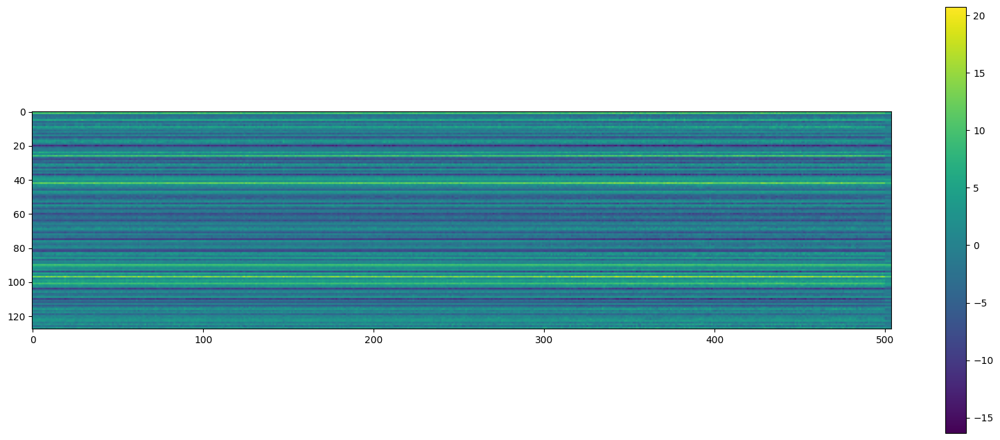

/u/li19/diffusers_with_dataloader/notebooks/imgs/simple_plotsound of a fart.png

a dog howling


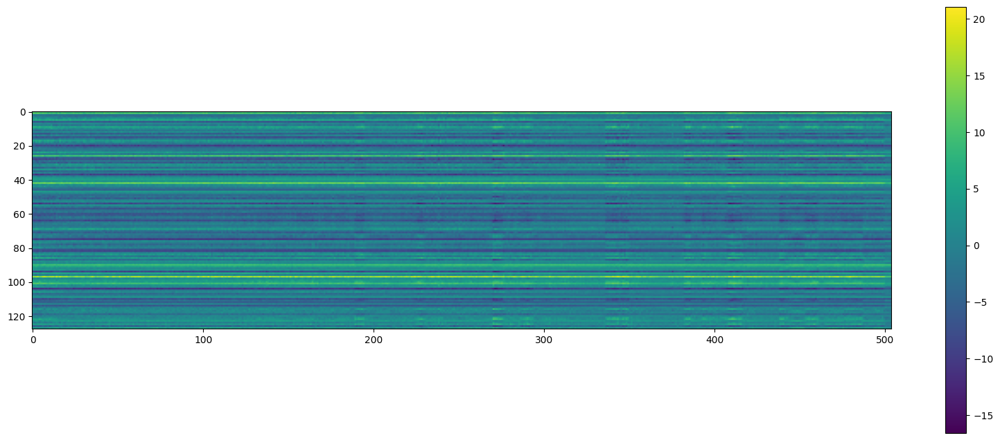

/u/li19/diffusers_with_dataloader/notebooks/imgs/simple_plota dog howling.png

Speech, Singing, and Yodeling


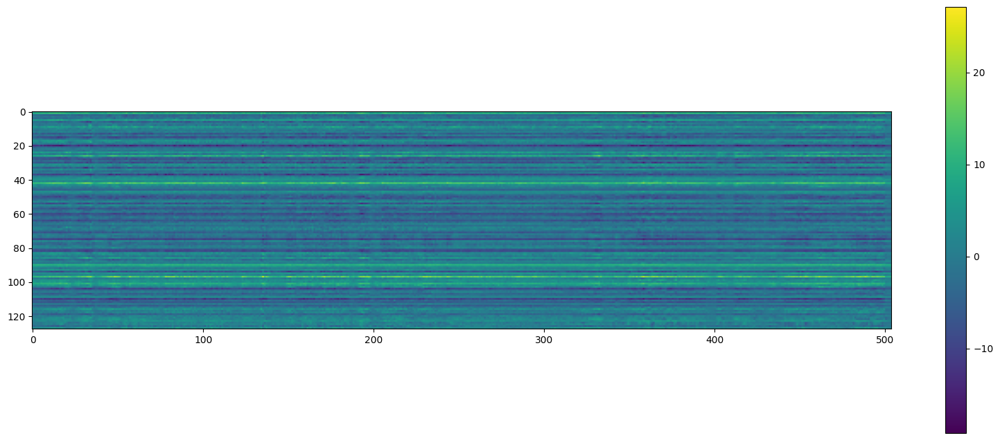

/u/li19/diffusers_with_dataloader/notebooks/imgs/simple_plotSpeech, Singing, and Yodeling.png

sound of a person gargling


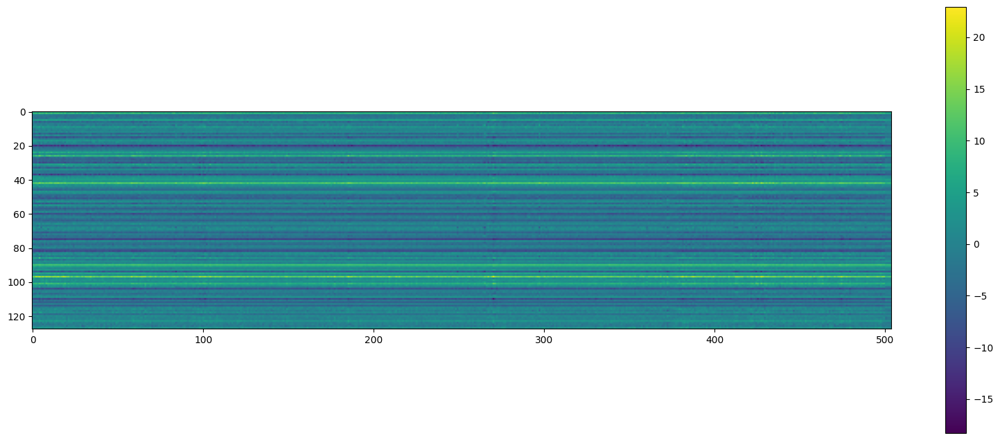

/u/li19/diffusers_with_dataloader/notebooks/imgs/simple_plotsound of a person gargling.png

 sound of A Hammer striking wood


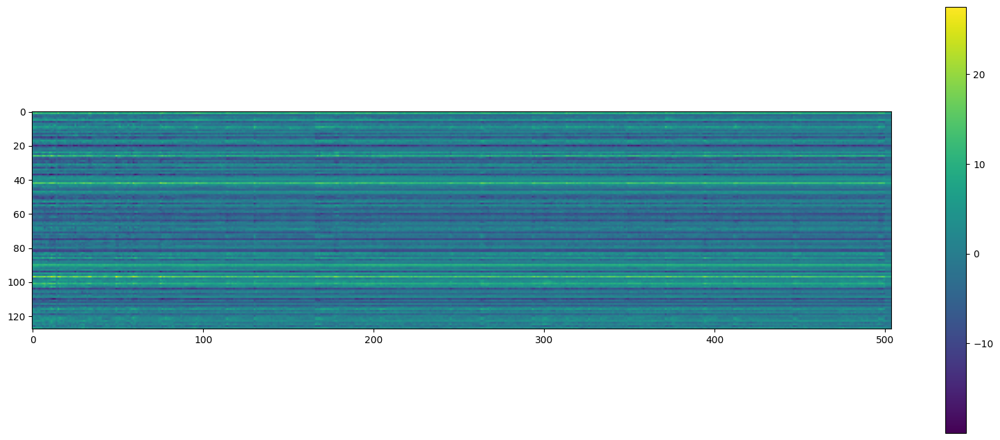

/u/li19/diffusers_with_dataloader/notebooks/imgs/simple_plot sound of A Hammer striking wood.png

A train whistle heard in the distance


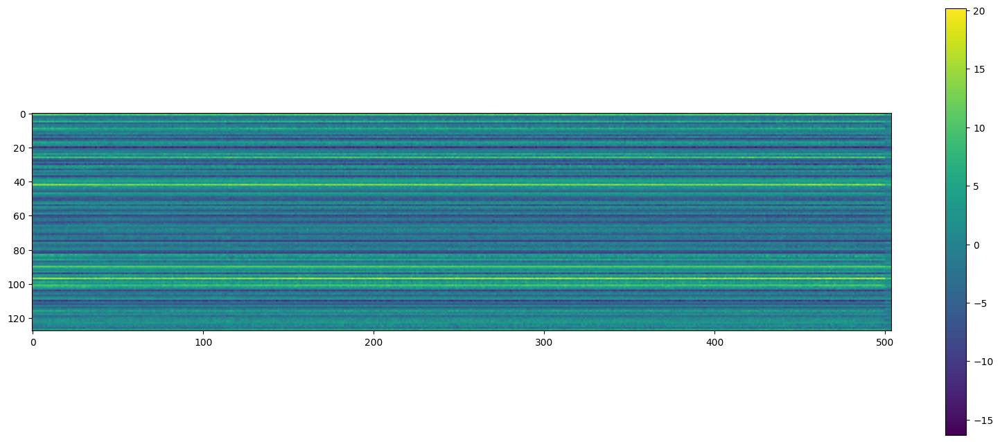

/u/li19/diffusers_with_dataloader/notebooks/imgs/simple_plotA train whistle heard in the distance.png

The sound of Brass instrument together with piano, playing very sad music


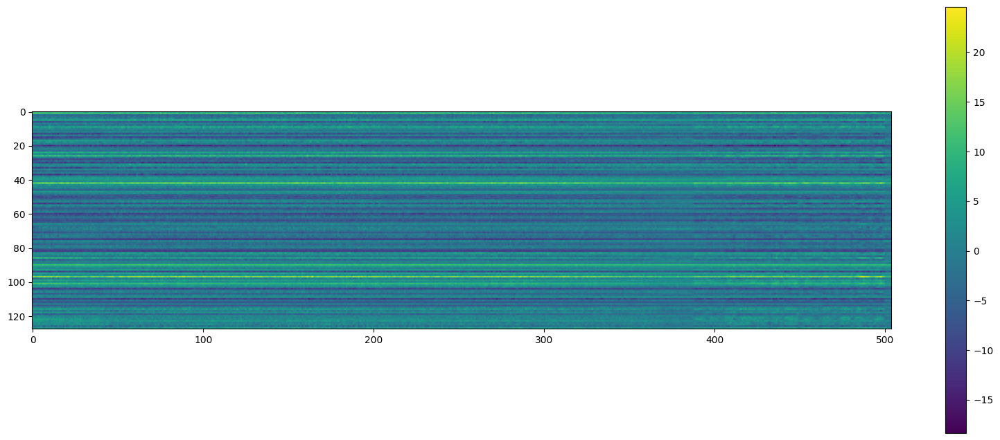

/u/li19/diffusers_with_dataloader/notebooks/imgs/simple_plotThe sound of Brass instrument together with piano, playing very sad music.png

The sound of Brass instrument together with piano, playing very happy music


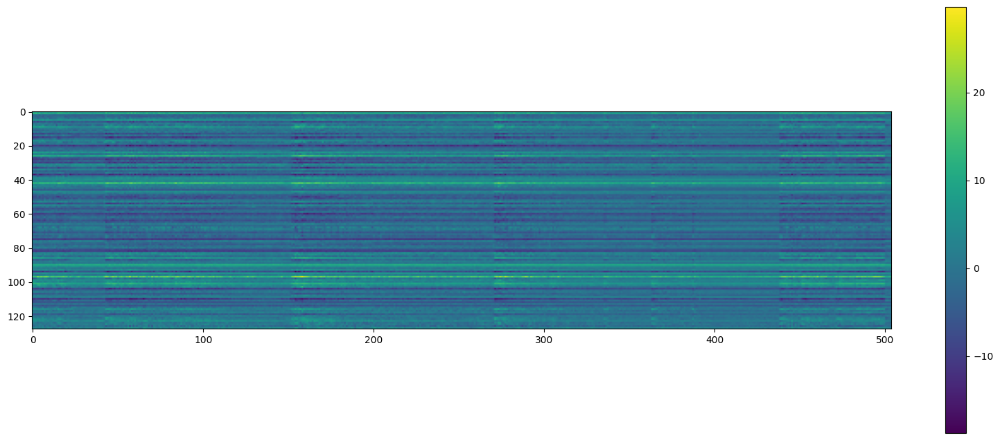

/u/li19/diffusers_with_dataloader/notebooks/imgs/simple_plotThe sound of Brass instrument together with piano, playing very happy music.png

In [30]:

# print("================================MULTI PROMPT================================")
for norm_img, cap in zip(norm_imgs, prompts):
    print(cap)
    plt.figure(figsize=(20,8))
    plt.imshow(norm_img[0].cpu().numpy())
    filename = f'imgs/simple_plot{cap}.png'

    plt.savefig(filename)

    plt.colorbar()
    plt.show()
    display(FileLink(filename))

    
# for img, cap in zip(imgs, prompts):
#     print(cap)
#     plt.figure(figsize=(20,8))
#     plt.imshow(img[0].cpu().numpy())

#     plt.colorbar()
#     plt.show()
    # show_split_img(img[0,:,:].cpu())

In [31]:
for scaled, vanilla in zip(norm_imgs, imgs):
    print("======= STATS =======")
    print(f'Scaled - Mean {scaled.mean()} : STD: {scaled.std()}')
    print(f'Vanilla - Mean {vanilla.mean()} : STD: {vanilla.std()}')

======= STATS =======
Scaled - Mean -0.5395039319992065 : STD: 5.078490734100342
Vanilla - Mean -0.03143575042486191 : STD: 1.268257737159729
======= STATS =======
Scaled - Mean -0.6027839183807373 : STD: 5.080786228179932
Vanilla - Mean -0.09015435725450516 : STD: 1.522112488746643
======= STATS =======
Scaled - Mean -0.45315274596214294 : STD: 4.840539932250977
Vanilla - Mean 0.03643224388360977 : STD: 1.0881640911102295
======= STATS =======
Scaled - Mean -0.45208239555358887 : STD: 4.937780857086182
Vanilla - Mean 0.03226441517472267 : STD: 1.341444492340088
======= STATS =======
Scaled - Mean -0.5757248997688293 : STD: 5.271995544433594
Vanilla - Mean -0.05524538457393646 : STD: 1.4779002666473389
======= STATS =======
Scaled - Mean -0.48758697509765625 : STD: 4.515562057495117
Vanilla - Mean 0.034197814762592316 : STD: 1.121923565864563
======= STATS =======
Scaled - Mean -0.493507444858551 : STD: 5.18274450302124
Vanilla - Mean -0.011036747135221958 : STD: 1.3553085327148438
===

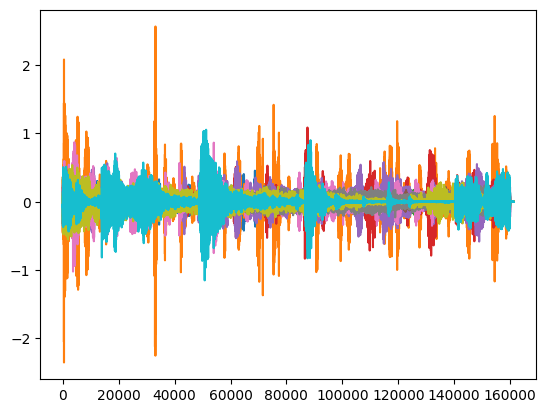

In [32]:
sample_audios = []
for idx in range(len(norm_imgs)):
    sample = norm_imgs[idx]
    output = model.decoder(sample)
    final = output[0][0].detach().cpu().numpy()
    # print(prompts[idx])
    plt.plot(final)
    sample_audios.append((prompts[idx], final))
    # ipd.Audio(final, rate=16000)

In [33]:
def plot_spectrogram(prompt, final):
    n_fft = 4096
    win_length = 1024
    hop_length = 400
    n_mels = 64
    sample_rate = 16000

    waveform = torch.from_numpy(np.copy(final)[None, :])



    mel_spectrogram_transform = torchaudio.transforms.MelSpectrogram(
        sample_rate=sample_rate,
        n_fft=n_fft,
        win_length=win_length,
        hop_length=hop_length,
        center=True,
        pad_mode="constant",
        power=2.0,
        norm="slaney",
        onesided=True,
        n_mels=n_mels,
        mel_scale="slaney",
    )

    mel_spectrogram = mel_spectrogram_transform(waveform)
    amplitude_to_db_transform = torchaudio.transforms.AmplitudeToDB(stype='power', top_db=88)
    log_mel_spectrogram_db = amplitude_to_db_transform(mel_spectrogram)
    # log_mel_spectrogram_db = log_mel_spectrogram_db.transpose(0,1)
    # Set the figure size
    fig= plt.figure(figsize=(20, 10))
    # Show the image
    plt.imshow(log_mel_spectrogram_db[0], origin='lower')
    filename = f'imgs/spectrogram_{prompt}.png'
    plt.savefig(filename)
    plt.show()
    display(FileLink(filename))

Playing: sound of shuffling cards


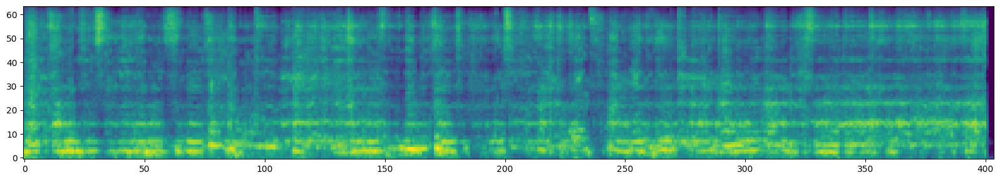

/u/li19/diffusers_with_dataloader/notebooks/imgs/spectrogram_sound of shuffling cards.png

Playing: sound of a bird


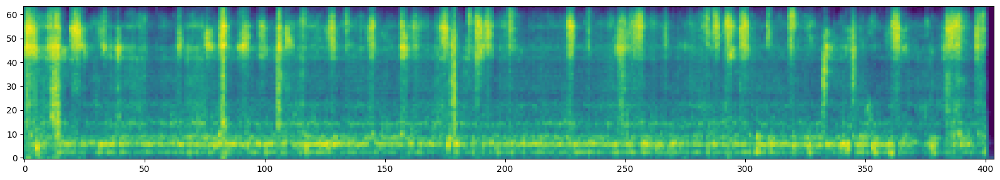

/u/li19/diffusers_with_dataloader/notebooks/imgs/spectrogram_sound of a bird.png

Playing: sound of a fart


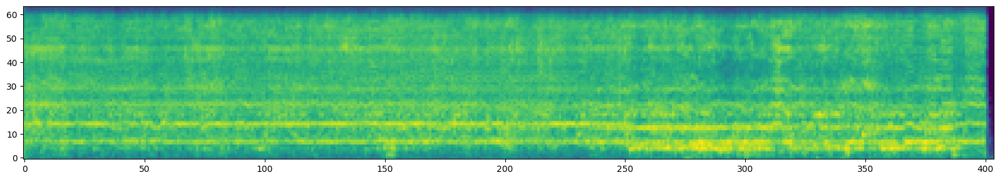

/u/li19/diffusers_with_dataloader/notebooks/imgs/spectrogram_sound of a fart.png

Playing: a dog howling


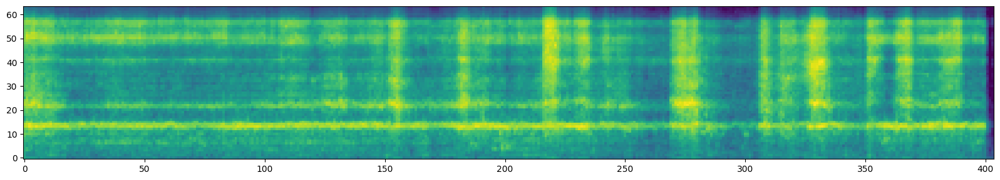

/u/li19/diffusers_with_dataloader/notebooks/imgs/spectrogram_a dog howling.png

Playing: Speech, Singing, and Yodeling


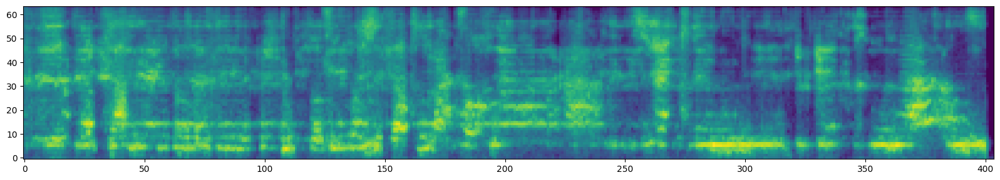

/u/li19/diffusers_with_dataloader/notebooks/imgs/spectrogram_Speech, Singing, and Yodeling.png

Playing: sound of a person gargling


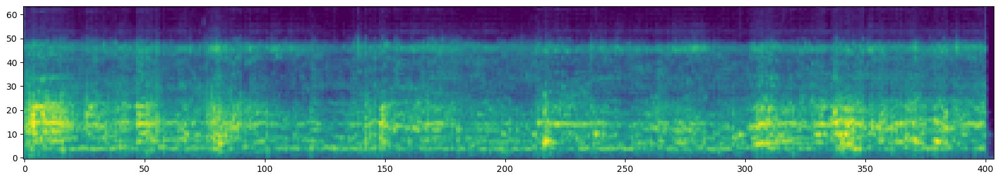

/u/li19/diffusers_with_dataloader/notebooks/imgs/spectrogram_sound of a person gargling.png

Playing:  sound of A Hammer striking wood


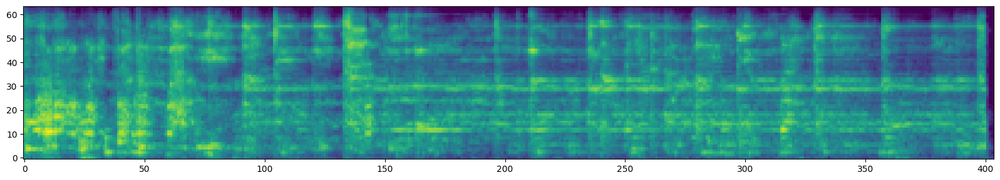

/u/li19/diffusers_with_dataloader/notebooks/imgs/spectrogram_ sound of A Hammer striking wood.png

Playing: A train whistle heard in the distance


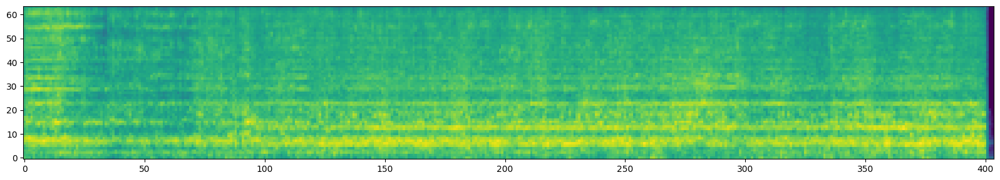

/u/li19/diffusers_with_dataloader/notebooks/imgs/spectrogram_A train whistle heard in the distance.png

Playing: The sound of Brass instrument together with piano, playing very sad music


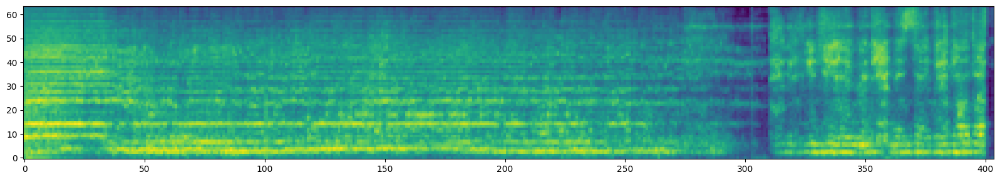

/u/li19/diffusers_with_dataloader/notebooks/imgs/spectrogram_The sound of Brass instrument together with piano, playing very sad music.png

Playing: The sound of Brass instrument together with piano, playing very happy music


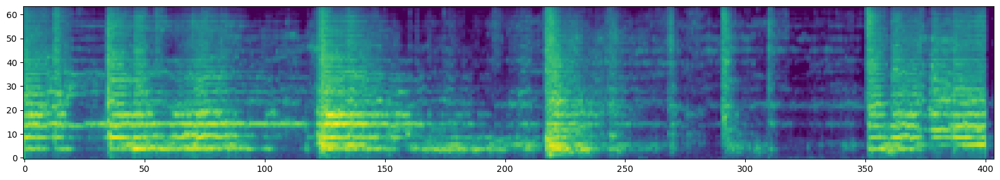

/u/li19/diffusers_with_dataloader/notebooks/imgs/spectrogram_The sound of Brass instrument together with piano, playing very happy music.png

In [34]:
for prompt, audio in sample_audios:
    print(f"Playing: {prompt}")
    ipd.display(ipd.Audio(audio, rate=16000))
    plot_spectrogram(prompt, audio)